<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/World_Happiness_Ranking_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# World Happiness Ranking Dataset

# About the dataset

The dataset, world_happiness_report.csv, compiles various factors contributing to global happiness rankings. It includes columns such as 'Country', 'Region', 'Happiness Rank', 'Happiness Score', and several socio-economic indicators like 'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual', and 'year'. The dataset spans multiple years, as indicated by the 'year' column, though it contains data points that vary across years, with 2015 being the initial year.

Data Size and Structure: The DataFrame df has 1231 entries and 14 columns. We observed an 'Unnamed: 0' column, which often indicates an index column from the original CSV that can usually be dropped.

Missing Values: A significant observation is the presence of numerous missing values, particularly in 'Region', 'Happiness Rank', 'Happiness Score', 'Standard Error', 'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)', and 'Dystopia Residual'. These columns only have about 315 non-null entries, suggesting inconsistent data collection or reporting across countries and years. 'Country' and 'Generosity' also have some missing values, but to a lesser extent. This will require careful handling during any subsequent modeling or in-depth analysis.

Univariate Distributions: Histograms for numerical columns showed varying distributions. 'Happiness Score' appears somewhat normally distributed, while others like 'Economy (GDP per Capita)' and 'Health (Life Expectancy)' are often skewed. For categorical columns, 'Country' has 192 unique values, and 'Region' has 10 unique values, with 'Sub-Saharan Africa' being the most frequent region.

Bivariate Relationships: Scatter plots between numerical variables highlighted potential correlations. For instance, 'Happiness Score' often shows positive correlations with 'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)', and 'Freedom', implying that higher scores in these factors tend to coincide with greater happiness. Box plots against categorical variables like 'Region' and numerical variables often showed differences in happiness scores or other indicators across different regions. The correlation matrix visually confirmed these relationships, with strong positive correlations between 'Happiness Score' and several key factors, and minimal or no correlation with others.

These initial insights emphasize the importance of data cleaning and preprocessing, especially addressing the missing values, before proceeding with deeper analytical tasks.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d nalisha/world-happiness-ranking-dataset

# Unziping the downloaded file
!unzip world-happiness-ranking-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/nalisha/world-happiness-ranking-dataset
License(s): CC0-1.0
  0% 0.00/21.2k [00:00<?, ?B/s]
100% 21.2k/21.2k [00:00<00:00, 78.7MB/s]
Archive:  world-happiness-ranking-dataset.zip
  inflating: world_happiness_report.csv  


In [3]:
df = pd.read_csv('world_happiness_report.csv')
df.head(11)

,Unnamed: 0,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,year
0,0,Switzerland,Western Europe,1.0,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,1,Iceland,Western Europe,2.0,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015
2,2,Denmark,Western Europe,3.0,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204,2015
3,3,Norway,Western Europe,4.0,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531,2015
4,4,Canada,North America,5.0,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176,2015
5,5,Finland,Western Europe,6.0,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.41372,0.23351,2.61955,2015
6,6,Netherlands,Western Europe,7.0,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.47610,2.46570,2015
7,7,Sweden,Western Europe,8.0,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262,2.37119,2015
8,8,New Zealand,Australia and New Zealand,9.0,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.42922,0.47501,2.26425,2015
9,9,Australia,Australia and New Zealand,10.0,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.35637,0.43562,2.26646,2015


In [4]:
df.tail(11)

,Unnamed: 0,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,year
1220,1220,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1221,1221,Malawi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1222,1222,Tanzania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1223,1223,Sierra Leone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1224,1224,Lesotho*,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1225,1225,Botswana*,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1226,1226,Rwanda*,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1227,1227,Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1228,1228,Lebanon,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
1229,1229,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022


In [7]:
df.shape

(1231, 14)

In [6]:
df.columns

Index(['Unnamed: 0', 'Country', 'Region', 'Happiness Rank', 'Happiness Score',
       'Standard Error', 'Economy (GDP per Capita)', 'Family',
       'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)',
       'Generosity', 'Dystopia Residual', 'year'],
      dtype='object')

In [8]:
df.dtypes

,0
Unnamed: 0,int64
Country,object
Region,object
Happiness Rank,float64
Happiness Score,float64
Standard Error,float64
Economy (GDP per Capita),float64
Family,float64
Health (Life Expectancy),float64
Freedom,float64


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1231 entries, 0 to 1230
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     1231 non-null   int64  
 1   Country                        617 non-null    object 
 2   Region                         315 non-null    object 
 3   Happiness Rank                 315 non-null    float64
 4   Happiness Score                315 non-null    float64
 5   Standard Error                 158 non-null    float64
 6   Economy (GDP per Capita)       315 non-null    float64
 7   Family                         470 non-null    float64
 8   Health (Life Expectancy)       315 non-null    float64
 9   Freedom                        470 non-null    float64
 10  Trust (Government Corruption)  315 non-null    float64
 11  Generosity                     1084 non-null   float64
 12  Dystopia Residual              315 non-null    f

In [11]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Unnamed: 0,1231.0,NaN,NaN,NaN,615.0,355.503399,0.0,307.5,615.0,922.5,1230.0
Country,617,192,Switzerland,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region,315,10,Sub-Saharan Africa,78,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Happiness Rank,315.0,NaN,NaN,NaN,79.238095,45.538922,1.0,40.0,79.0,118.5,158.0
Happiness Score,315.0,NaN,NaN,NaN,5.378949,1.141531,2.839,4.51,5.286,6.269,7.587
Standard Error,158.0,NaN,NaN,NaN,0.047885,0.017146,0.01848,0.037268,0.04394,0.0523,0.13693
Economy (GDP per Capita),315.0,NaN,NaN,NaN,0.899837,0.41078,0.0,0.5949,0.97306,1.229,1.82427
Family,470.0,NaN,NaN,NaN,0.990347,0.318707,0.0,0.793,1.025665,1.228745,1.610574
Health (Life Expectancy),315.0,NaN,NaN,NaN,0.594054,0.24079,0.0,0.419645,0.64045,0.78764,1.02525
Freedom,470.0,NaN,NaN,NaN,0.402828,0.150356,0.0,0.297615,0.418347,0.51685,0.66973


In [12]:
df.isnull().sum()

,0
Unnamed: 0,0
Country,614
Region,916
Happiness Rank,916
Happiness Score,916
Standard Error,1073
Economy (GDP per Capita),916
Family,761
Health (Life Expectancy),916
Freedom,761


In [13]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

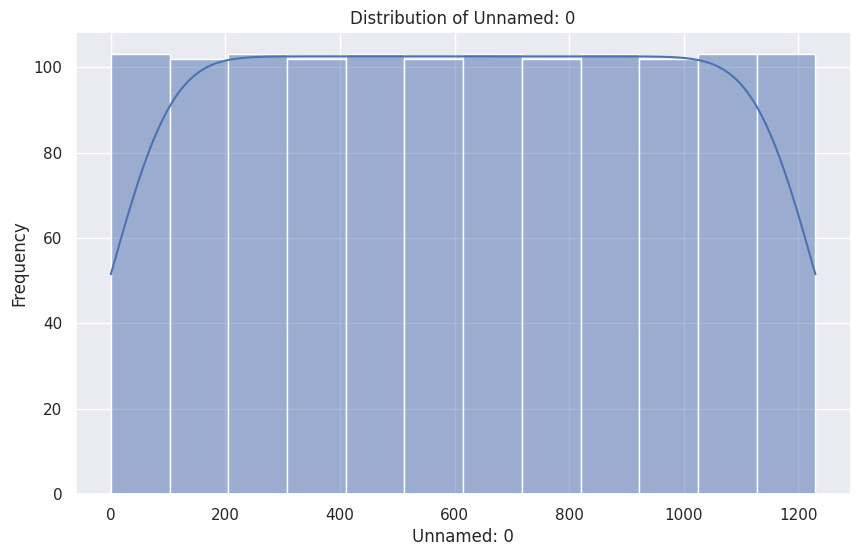

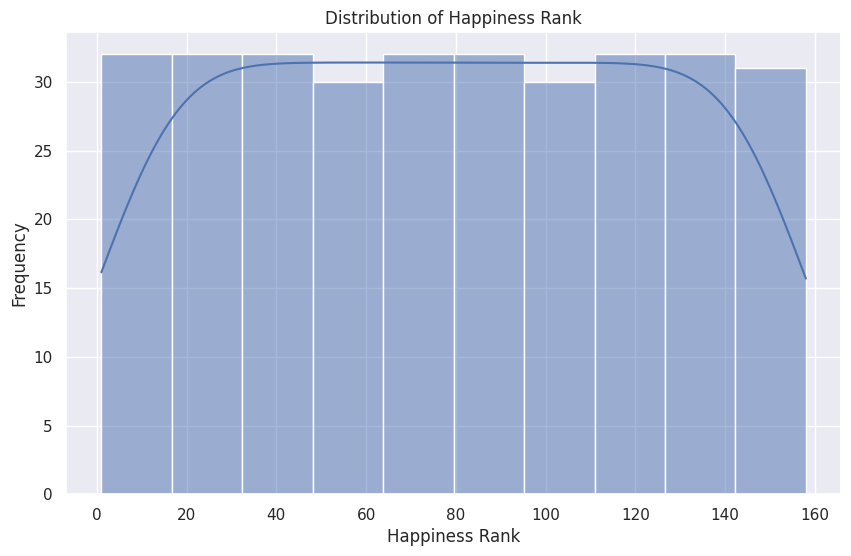

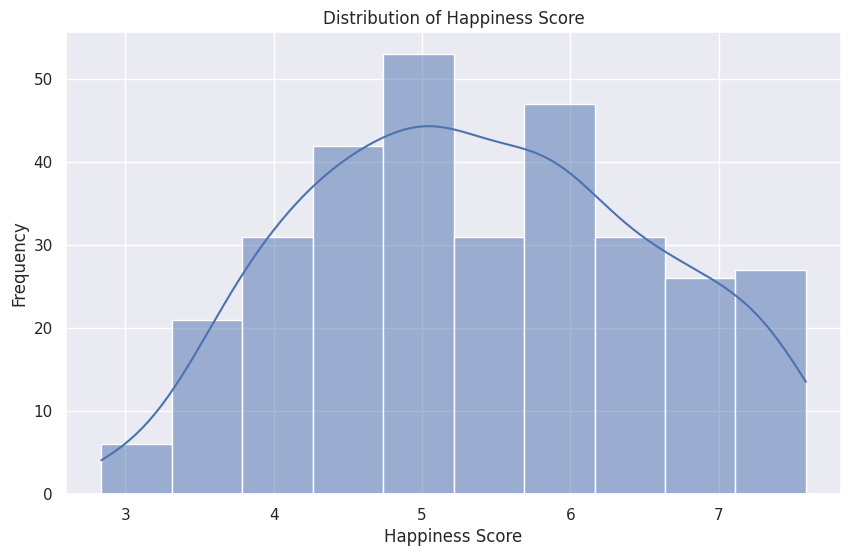

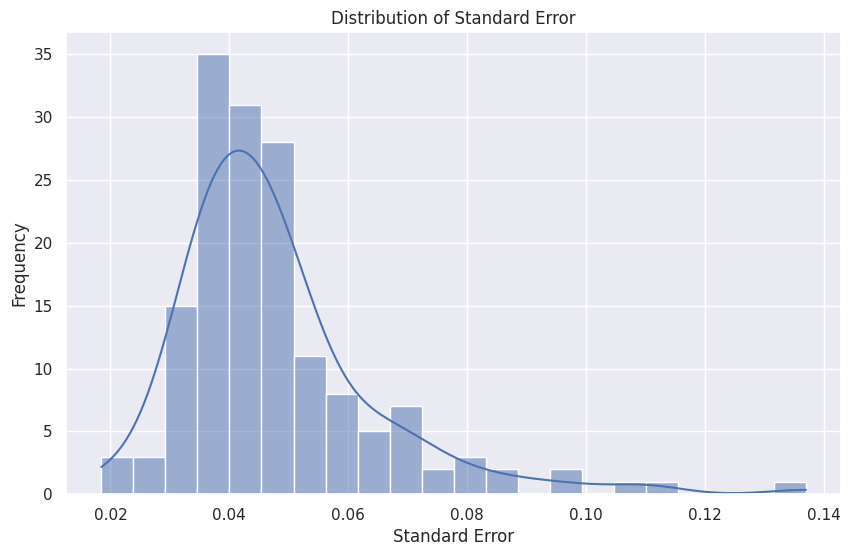

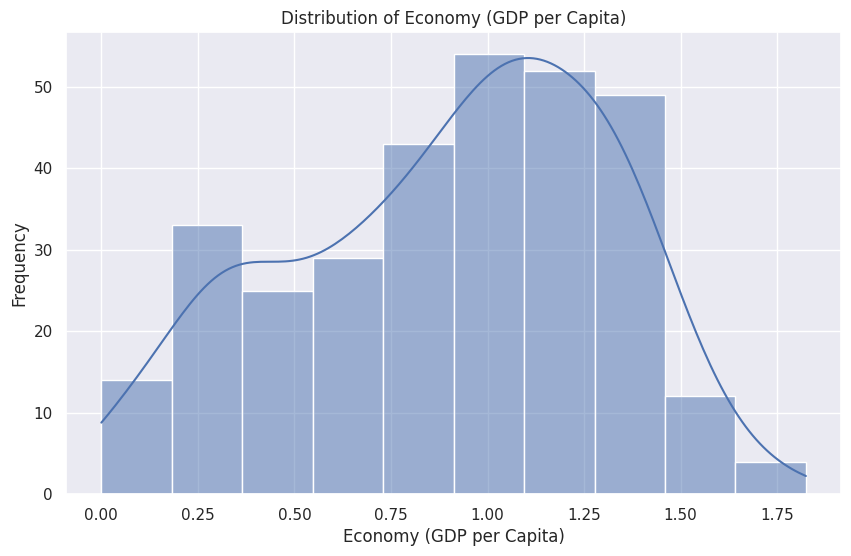

...

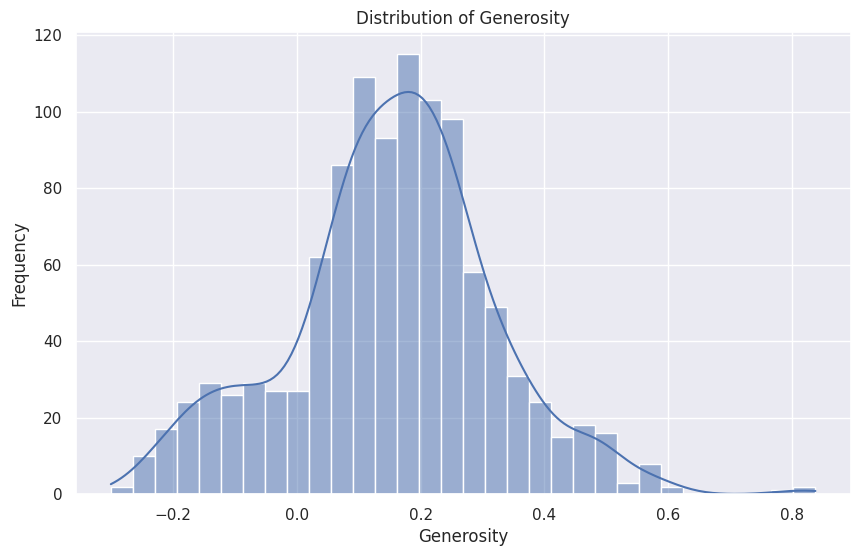

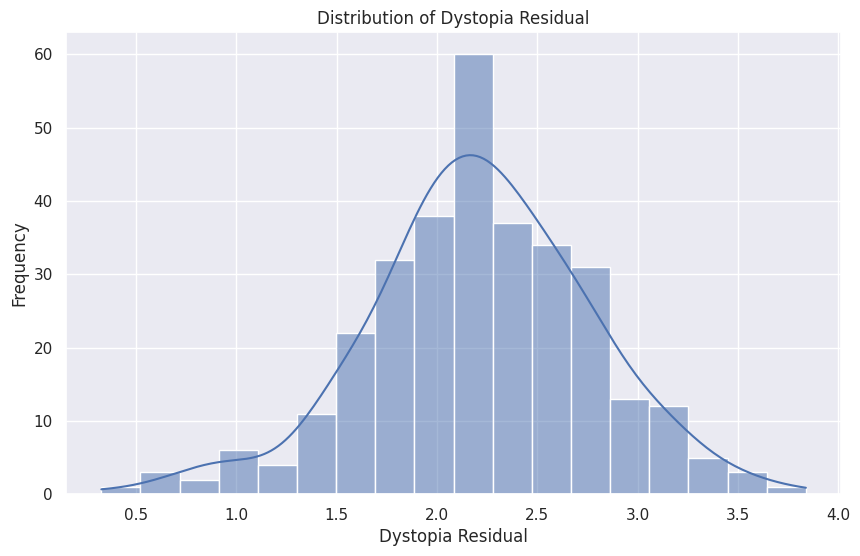

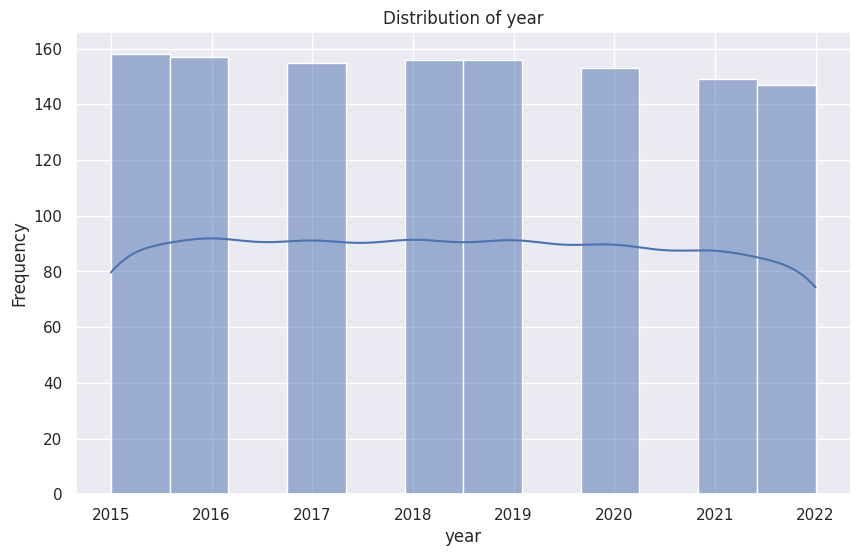

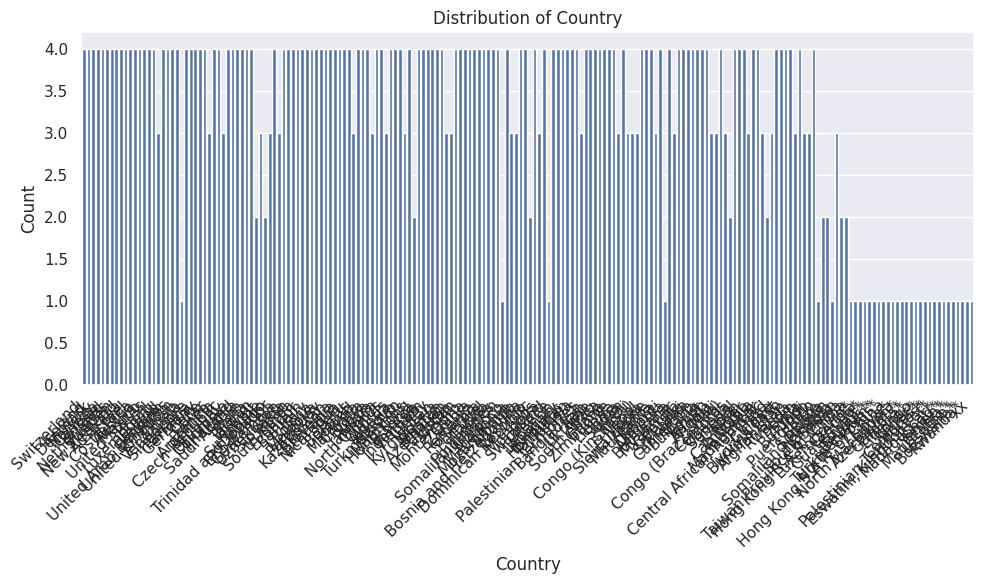

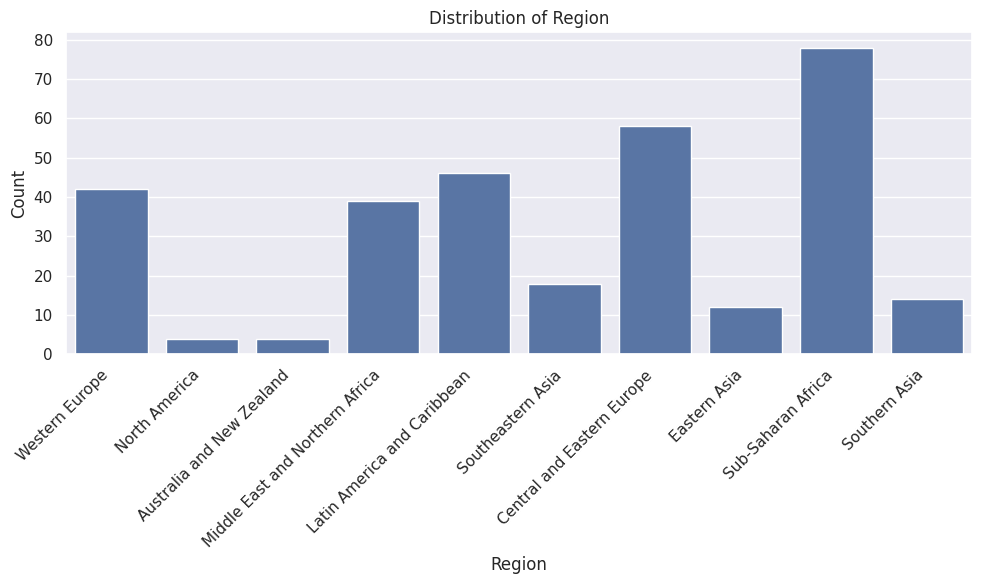

Value counts for Country:
Country
Switzerland    4
Iceland        4
Denmark        4
Norway         4
Canada         4
              ..
Mauritania*    1
Lesotho*       1
Botswana*      1
Rwanda*        1
xx             1
Name: count, Length: 192, dtype: int64

Value counts for Region:
Region
Sub-Saharan Africa                 78
Central and Eastern Europe         58
Latin America and Caribbean        46
Western Europe                     42
Middle East and Northern Africa    39
Southeastern Asia                  18
Southern Asia                      14
Eastern Asia                       12
North America                       4
Australia and New Zealand           4
Name: count, dtype: int64



In [14]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterating through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

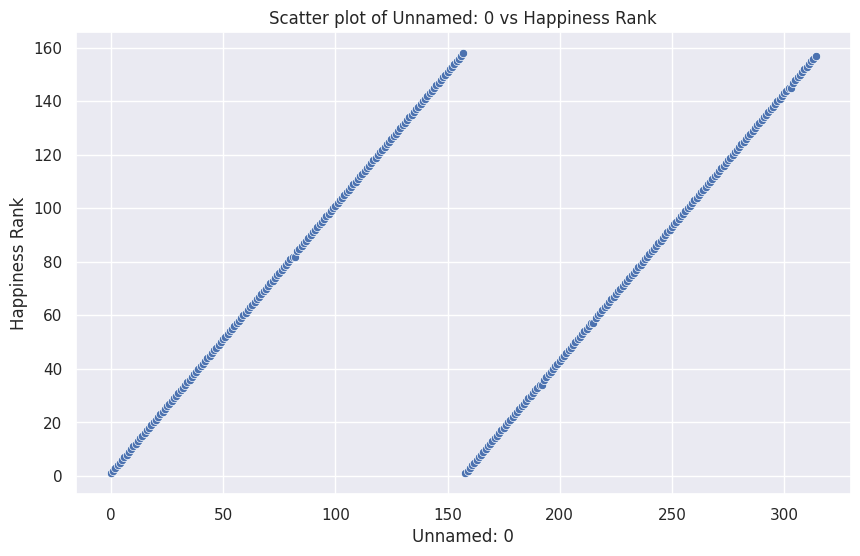

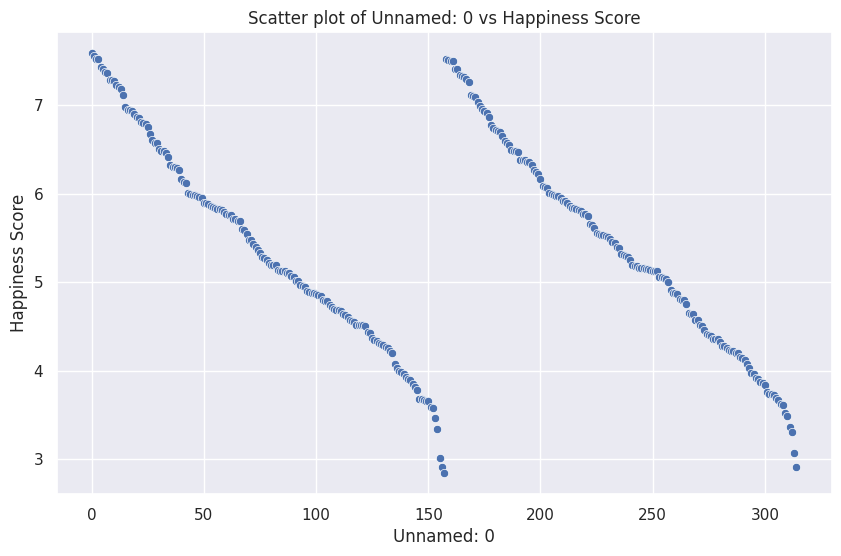

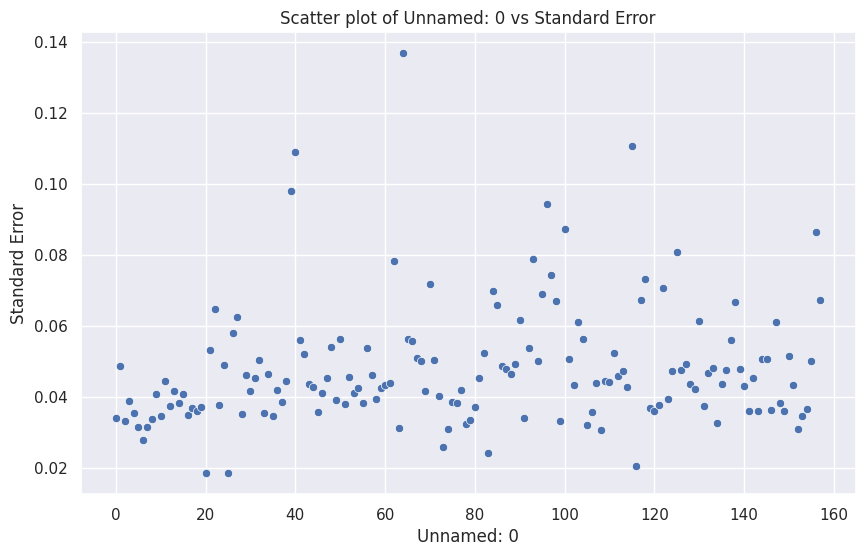

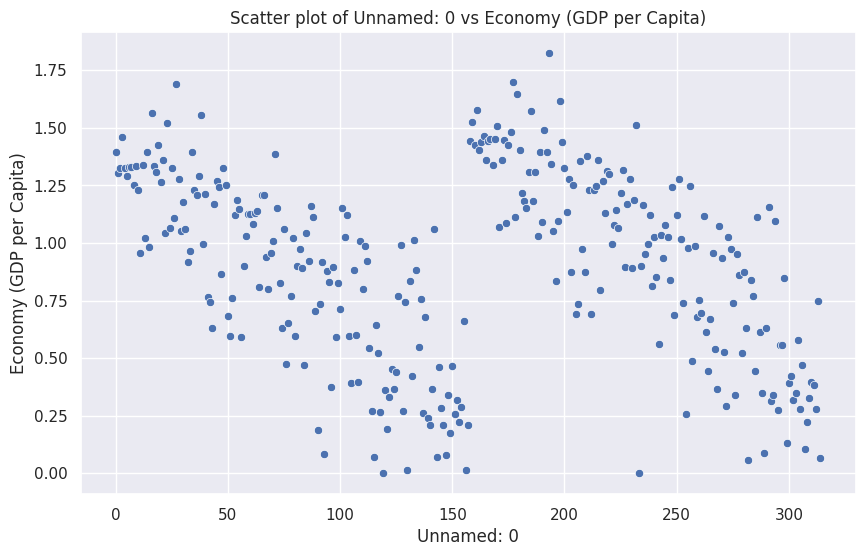

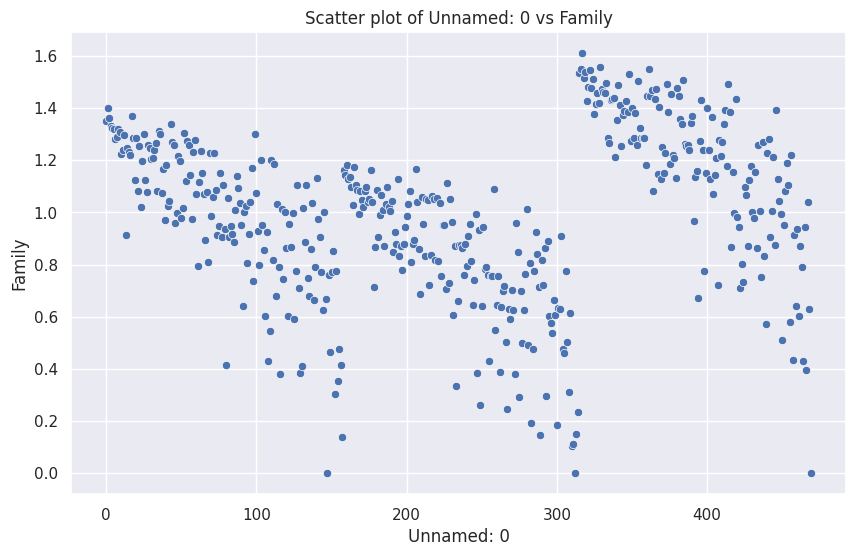

...

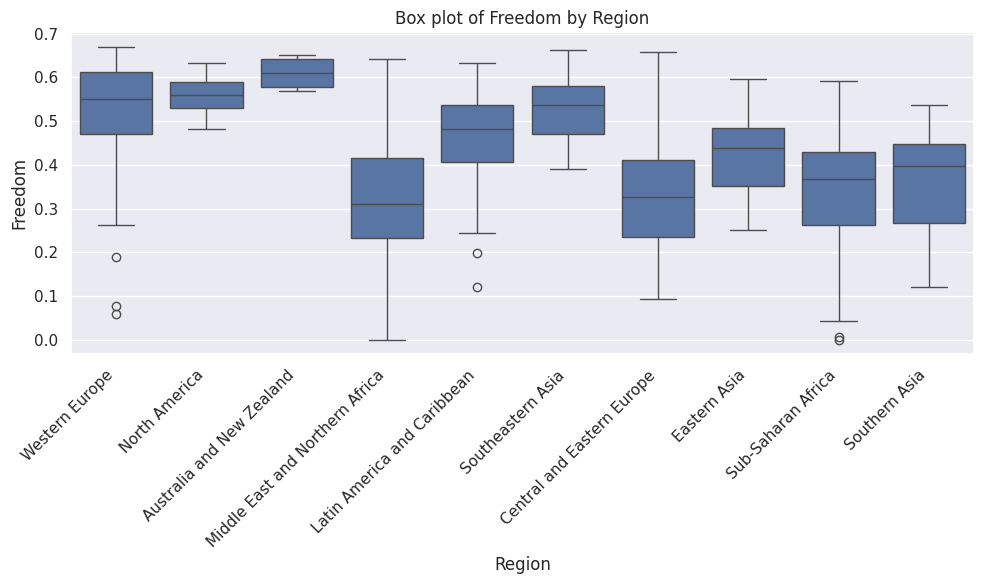

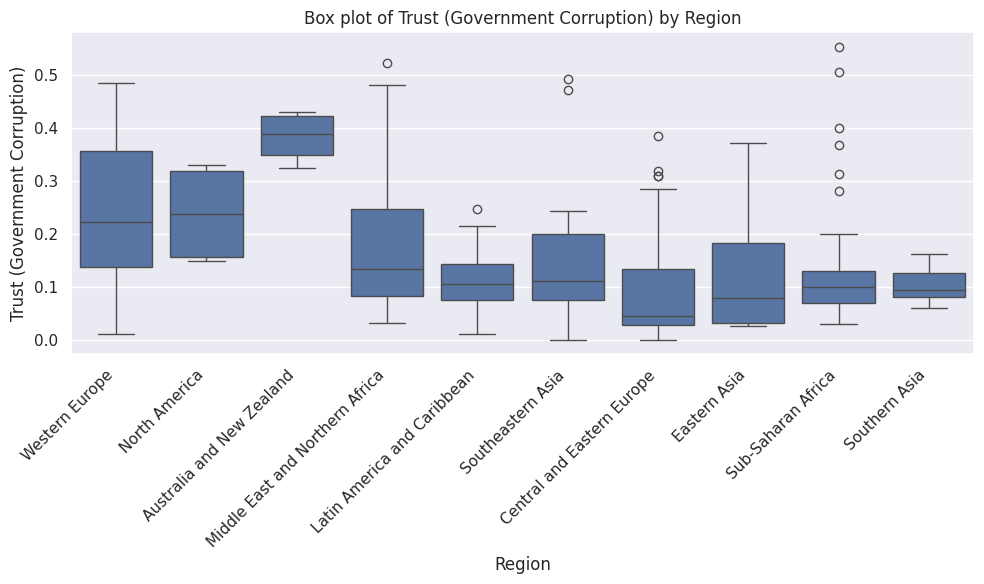

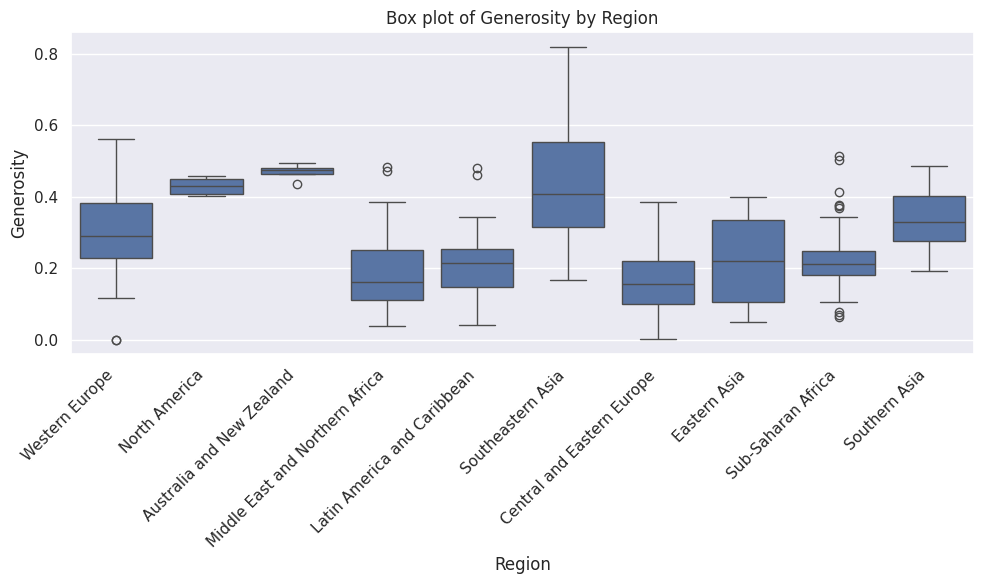

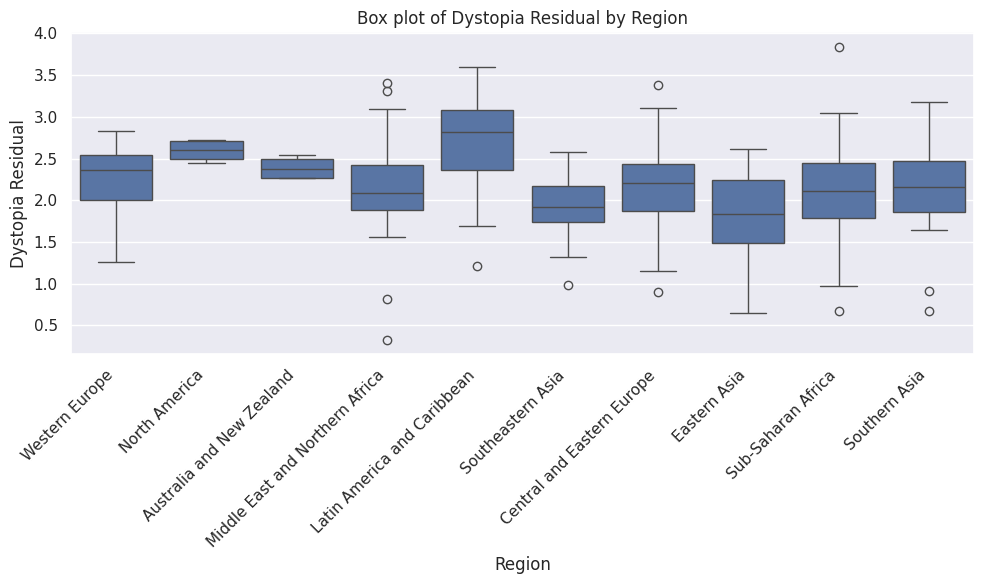

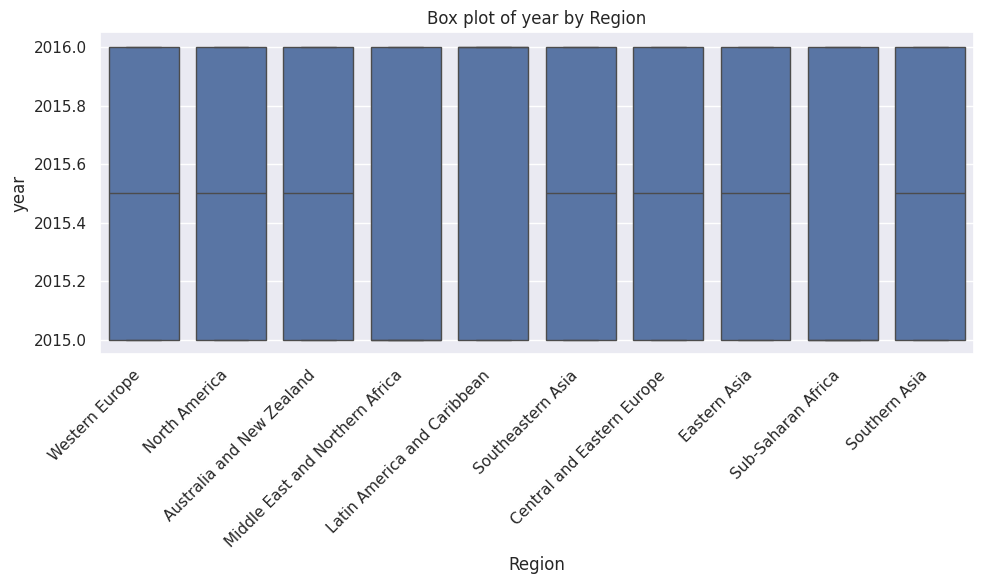

In [15]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

# Pair-Plot

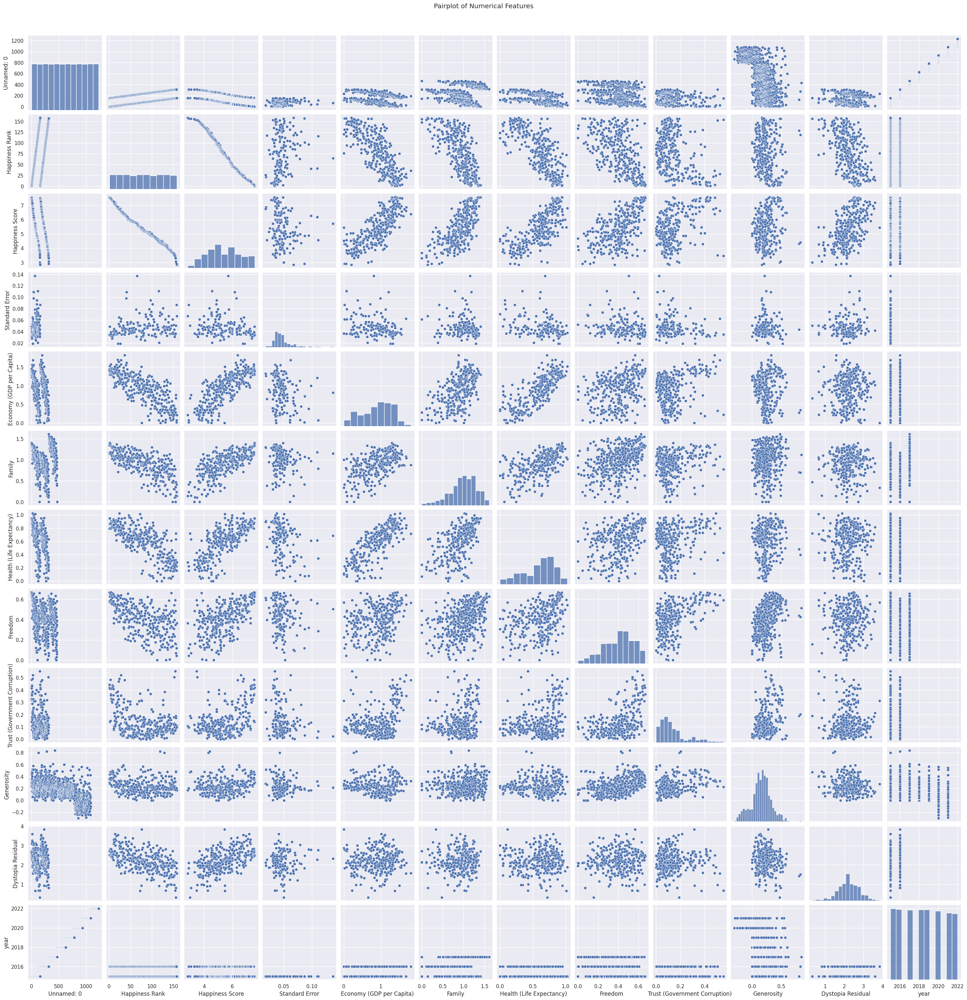

In [16]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

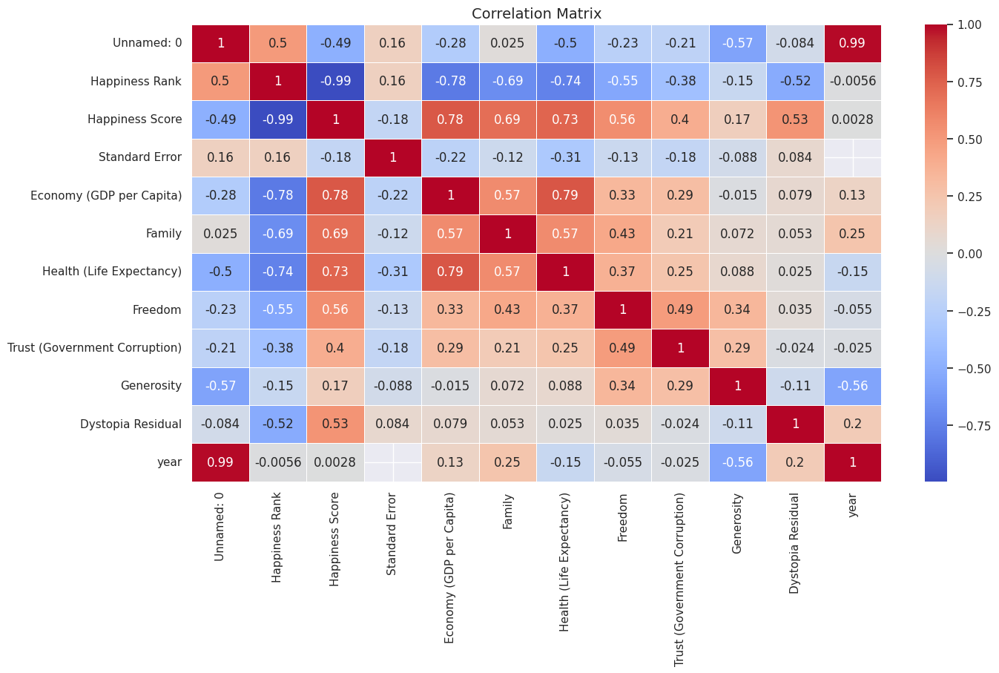

In [17]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You